In [1]:
import pandas as pd
import pytz
import numpy as np
from datetime import datetime, timedelta
import matplotlib.pyplot as plt


def pre_processing(file):
    #file inladen
    df = pd.read_csv(file)

    #omzetten tijden
    gmt_tz = pytz.timezone("GMT")
    pst_tz = pytz.timezone("US/Pacific")

    df['connectionTime'] = pd.to_datetime(df['connectionTime'], utc=True, errors='coerce')
    df['disconnectTime'] = pd.to_datetime(df['disconnectTime'], utc=True, errors='coerce')
    df['doneChargingTime'] = pd.to_datetime(df['doneChargingTime'], utc=True, errors='coerce')

    df['connectionTime'] = df['connectionTime'].dt.tz_convert(pst_tz)
    df['disconnectTime'] = df['disconnectTime'].dt.tz_convert(pst_tz)
    df['doneChargingTime'] = df['doneChargingTime'].dt.tz_convert(pst_tz)

    df['LoadDone'] = df['kWhDelivered'] / ((df['doneChargingTime'] - df['connectionTime']).dt.total_seconds() / 3600)
    df['LoadDisc'] = df['kWhDelivered'] / ((df['disconnectTime'] - df['connectionTime']).dt.total_seconds() / 3600)

    df = df.dropna(subset=['connectionTime', 'disconnectTime', 'kWhDelivered', 'LoadDone', 'doneChargingTime', 'LoadDisc'])

    return df

def plotter(file, choice):
    minutes_in_day = 24 * 60
    energy_per_minute = np.zeros(minutes_in_day)
    count_per_minute = np.zeros(minutes_in_day)
    
    for _, row in file.iterrows():
        connection = row['connectionTime']
        done = row['doneChargingTime']
        disconnection = row['disconnectTime']
        
        if choice == 'done':
            end = done
            energy = row['LoadDone']

        if choice == 'disc':
            end = disconnection
            energy = row['LoadDisc']
        
        start = connection
        
        if end <= start:
            continue  # Skip invalid sessions

        duration_minutes = int((end - start).total_seconds() / 60)

        for i in range(duration_minutes):
            minute_time = start + timedelta(minutes=i)
            minute_of_day = minute_time.hour * 60 + minute_time.minute
            energy_per_minute[minute_of_day] += energy
            count_per_minute[minute_of_day] += 1
    
    return energy_per_minute/210

  


    

C:\Users\mathi\AppData\Local\Temp\ipykernel_36952\968630092.py:10: DtypeWarning: Columns (169,170,171,177,178,179,185,186,187) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file)
C:\Users\mathi\AppData\Local\Temp\ipykernel_36952\968630092.py:10: DtypeWarning: Columns (169,170,171,177,178,179,185,186,187) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file)


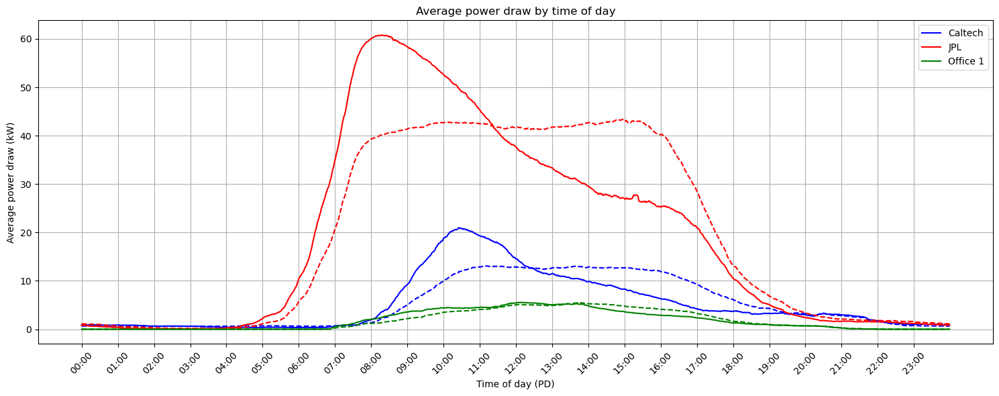

In [2]:
#display(pre_processing("Data/acndata_sessions 2019_11 till 2020_5 caltech.csv"))
energy_file11 = plotter(pre_processing("Data/acndata_sessions 2019_11 till 2020_5 caltech.csv"),'done')
energy_file12 = plotter(pre_processing("Data/acndata_sessions 2019_11 till 2020_5 caltech.csv"),'disc')
energy_file21 = plotter(pre_processing("Data/acndata_sessions 2019_11 till 2020_5 jpl.csv"),'done') 
energy_file22 = plotter(pre_processing("Data/acndata_sessions 2019_11 till 2020_5 jpl.csv"),'disc')
energy_file31 = plotter(pre_processing("Data/acndata_sessions 2019_11 till 2020_5 office1.csv"), 'done')
energy_file32 = plotter(pre_processing("Data/acndata_sessions 2019_11 till 2020_5 office1.csv"), 'disc')

# Generate time labels for x-axis (every hour)
time_labels = [f"{h:02d}:00" for h in range(24)]
time_ticks = [h * 60 for h in range(24)]

# Plot the three energy curves on the same plot
plt.figure(figsize=(15, 6))
plt.plot(energy_file11, color='blue', label='Caltech', linewidth=1.5)
plt.plot(energy_file12, linestyle='--', color='blue', linewidth=1.5)
plt.plot(energy_file21, color='red', label='JPL', linewidth=1.5)
plt.plot(energy_file22, linestyle='--', color='red', linewidth=1.5)
plt.plot(energy_file31, color='green', label='Office 1', linewidth=1.5)
plt.plot(energy_file32, linestyle='--', color='green', linewidth=1.5)

# Customize the plot
plt.xticks(time_ticks, time_labels, rotation=45)
plt.xlabel("Time of day (PD)")
plt.ylabel("Average power draw (kW)")
plt.title("Average power draw by time of day")
plt.grid(True)
plt.legend()
plt.tight_layout()

# Show the plot
plt.show()


Nieuwe code hieronder:

In [30]:
pred_data =pd.read_csv('db_cleaned_with_predictions.csv')
pred_data['stayTime'] = pred_data['Actual_DisconnectTime'] - pred_data['ConnectionTime']
pred_data.loc[pred_data['stayTime'] < 0, 'stayTime'] += 24 
pred_data['LoadDisc'] = pred_data['Actual_kWhDelivered'] / pred_data['stayTime'] 
pred_data['LoadPred'] = pred_data['Predicted_kWhDelivered_NN'] / pred_data['stayTime'] 

jpl_data_pred = pred_data[pred_data['SiteID']==1]
cal_data_pred = pred_data[pred_data['SiteID']==2]
jpl_data_pred.head(5)

,ConnectionTime,SiteID,Actual_DisconnectTime,Actual_kWhDelivered,Predicted_DisconnectTime_NN,Predicted_kWhDelivered_NN,stayTime,LoadDisc,LoadPred
0,6.532500,1.0,14.991111,0.976,18.794254,11.113060,8.458611,0.115385,1.313816
3,7.052500,1.0,1.476944,27.996,8.882896,38.822343,18.424444,1.519503,2.107111
5,6.419722,1.0,23.676111,8.084,11.544849,9.310030,17.256389,0.468464,0.539512
6,15.045556,1.0,0.070278,6.205,4.587960,8.471654,9.024722,0.687556,0.938716
7,9.370000,1.0,22.421111,11.139,15.081124,9.417004,13.051111,0.853491,0.721548


In [ ]:
def plotter_new(file, choice):
    minutes_in_day = 24 * 60
    energy_per_minute = np.zeros(minutes_in_day)
    count_per_minute = np.zeros(minutes_in_day)
    
    for _, row in file.iterrows():
        connection = row['ConnectionTime']
        #done = row['doneChargingTime']
        disconnection = row['Actual_DisconnectTime']
        predicted_time = row['Predicted_DisconnectTime_NN']

        if choice == 'disc':
            end = disconnection
            energy = row['LoadDisc']

        if choice == 'pred':
            end = predicted_time
            energy = row['LoadPred']

        # if choice == 'done':
        #     end = done
        #     energy = row['LoadDone']
        
        start = connection
        
        

        duration_minutes = int(row['stayTime'] * 60)

        start_time = timedelta(hours=start)  # Convert float hour to timedelta

        for i in range(duration_minutes):
            minute_time = start_time + timedelta(minutes=i)
            minute_of_day = int(minute_time.total_seconds() // 60) % (24 * 60)  # Ensures it stays within [0, 1440)

            energy_per_minute[minute_of_day] += energy
            count_per_minute[minute_of_day] += 1
    
    return energy_per_minute/210

In [32]:
old_load_jpl = plotter_new(jpl_data_pred, 'disc')
new_load_jpl = plotter_new(jpl_data_pred, 'pred')
old_load_cal = plotter_new(cal_data_pred, 'disc')
new_load_cal = plotter_new(cal_data_pred, 'pred')


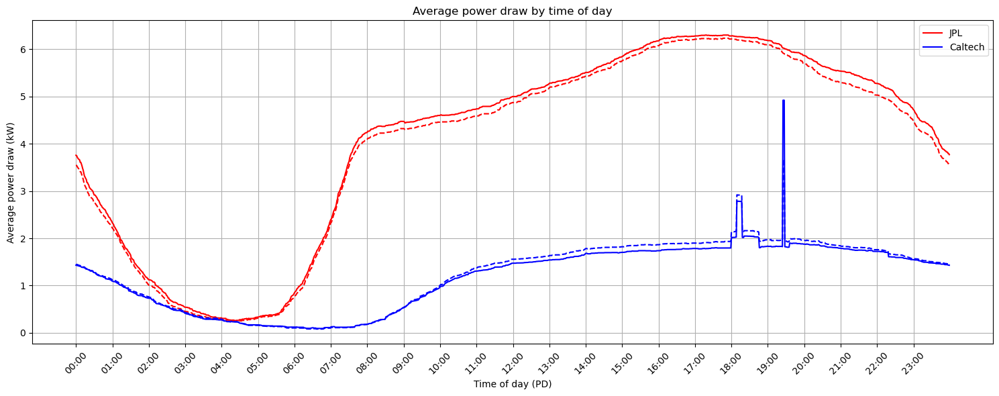

In [ ]:
plt.figure(figsize=(15, 6))
plt.plot(old_load_jpl, color='red', label='JPL', linewidth=1.5)
plt.plot(new_load_jpl, linestyle='--', color='red', linewidth=1.5)
plt.plot(old_load_cal, color='blue', label='Caltech', linewidth=1.5)
plt.plot(new_load_cal, linestyle='--', color='blue', linewidth=1.5)

# Customize the plot
plt.xticks(time_ticks, time_labels, rotation=45)
plt.xlabel("Time of day (PD)")
plt.ylabel("Average power draw (kW)")
plt.title("Average power draw by time of day, test data")
plt.grid(True)
plt.legend()
plt.tight_layout()

# Show the plot
plt.show()

In [9]:
import pandas as pd
import pytz
import numpy as np
from datetime import datetime, timedelta
import matplotlib.pyplot as plt


def maxpre_processing(file):
    #file inladen
    df = pd.read_csv(file)

    #datum column maken
    df['date_only'] = df['connectionTime'].str.split(' ', n=3).str[1] + ' ' + df['connectionTime'].str.split(' ', n=3).str[2] + ' ' + df['connectionTime'].str.split(' ', n=3).str[3].str.split(' ', n=1).str[0]

    #omzetten tijden
    gmt_tz = pytz.timezone("GMT")
    pst_tz = pytz.timezone("US/Pacific")

    df['connectionTime'] = pd.to_datetime(df['connectionTime'], utc=True, errors='coerce')
    df['disconnectTime'] = pd.to_datetime(df['disconnectTime'], utc=True, errors='coerce')
    df['doneChargingTime'] = pd.to_datetime(df['doneChargingTime'], utc=True, errors='coerce')

    df['connectionTime'] = df['connectionTime'].dt.tz_convert(pst_tz)
    df['disconnectTime'] = df['disconnectTime'].dt.tz_convert(pst_tz)
    df['doneChargingTime'] = df['doneChargingTime'].dt.tz_convert(pst_tz)

    df['LoadDone'] = df['kWhDelivered'] / ((df['doneChargingTime'] - df['connectionTime']).dt.total_seconds() / 3600)
    df['LoadDisc'] = df['kWhDelivered'] / ((df['disconnectTime'] - df['connectionTime']).dt.total_seconds() / 3600)

    df = df.dropna(subset=['connectionTime', 'disconnectTime', 'kWhDelivered', 'LoadDone', 'doneChargingTime', 'LoadDisc'])

    df = df.reset_index(drop=True)

    return df

def maxplotter(file, choice):
    minutes_in_day = 24 * 60
    my_dict = {}
    
    keys = list(set(file['date_only'].to_list()))  
    
    for datum in keys:
        energy_per_minute = np.zeros(minutes_in_day)
        for _, row in file[file["date_only"] == datum].iterrows():
            connection = row['connectionTime']
            done = row['doneChargingTime']
            disconnection = row['disconnectTime']
            
            if choice == 'done':
                end = done
                energy = row['LoadDone']

            if choice == 'disc':
                end = disconnection
                energy = row['LoadDisc']
            
            start = connection
            
            if end <= start:
                continue  # Skip invalid sessions

            duration_minutes = int((end - start).total_seconds() / 60)

            for i in range(duration_minutes):
                minute_time = start + timedelta(minutes=i)
                minute_of_day = minute_time.hour * 60 + minute_time.minute
                energy_per_minute[minute_of_day] = energy
                        
        my_dict[datum] = energy_per_minute
    return my_dict      

In [10]:
#display(pre_processing("Data/acndata_sessions 2019_11 till 2020_5 caltech.csv"))
energy_file11 = maxplotter(maxpre_processing("Data/acndata_sessions 2019_11 till 2020_5 caltech.csv"),'done')
#energy_file12 = plotter(pre_processing("Data/acndata_sessions 2019_11 till 2020_5 caltech.csv"),'disc')
energy_file21 = maxplotter(maxpre_processing("Data/acndata_sessions 2019_11 till 2020_5 jpl.csv"),'done') 
#energy_file22 = plotter(pre_processing("Data/acndata_sessions 2019_11 till 2020_5 jpl.csv"),'disc')
energy_file31 = maxplotter(maxpre_processing("Data/acndata_sessions 2019_11 till 2020_5 office1.csv"), 'done')
#energy_file32 = plotter(pre_processing("Data/acndata_sessions 2019_11 till 2020_5 office1.csv"), 'disc')

C:\Users\thijs\AppData\Local\Temp\ipykernel_20492\134514195.py:10: DtypeWarning: Columns (169,170,171,177,178,179,185,186,187) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file)


In [ ]:
# Generate time labels for x-axis (every hour)
time_labels = [f"{h:02d}:00" for h in range(24)]
time_ticks = [h * 60 for h in range(24)]

# Plot the three energy curves on the same plot
plt.figure(figsize=(15, 6))
plt.plot(energy_file11, color='blue', label='Caltech', linewidth=1.5)
plt.plot(energy_file12, linestyle='--', color='blue', linewidth=1.5)
plt.plot(energy_file21, color='red', label='JPL', linewidth=1.5)
plt.plot(energy_file22, linestyle='--', color='green', linewidth=1.5)
plt.plot(energy_file31, color='green', label='Office 1', linewidth=1.5)
plt.plot(energy_file32, linestyle='--', color='red', linewidth=1.5)

# Customize the plot
plt.xticks(time_ticks, time_labels, rotation=45)
plt.xlabel("Time of day (PD)")
plt.ylabel("Average power draw (kW)")
plt.title("Average power draw by time of day")
plt.grid(True)
plt.legend()
plt.tight_layout()

# Show the plot
plt.show()

In [25]:
dict1 = energy_file21
maxlist = [0] * 1440
df1 = pd.DataFrame(dict1)
for i in range(0,1440):
    for key in dict1.keys():
        print(key)
        print(dict1[key][i])
        if dict1[key][i] > maxlist[i]:
            maxlist[i] = dict1[key][i] 

15 Nov 2019
0.0
19 May 2020
0.0
17 Dec 2019
2.882909930715935
26 Dec 2019
0.0
29 Jan 2020
0.0
01 Mar 2020
0.0
27 Nov 2019
0.0
19 Nov 2019
2.8111455108359134
15 Dec 2019
0.0
04 Apr 2020
0.0
02 Nov 2019
6.365162200282088
17 Jan 2020
0.0
21 Jan 2020
0.0
09 Nov 2019
0.0
16 Feb 2020
0.0
30 Mar 2020
0.0
06 Apr 2020
0.0
10 Jan 2020
0.0
04 May 2020
0.0
06 Feb 2020
2.96598969384662
01 Nov 2019
2.6154166125048746
02 Dec 2019
0.0
18 Jan 2020
0.0
15 May 2020
0.0
17 Nov 2019
6.335827165433086
27 Mar 2020
0.0
24 Feb 2020
0.0
13 Feb 2020
4.99792681162914
13 Mar 2020
0.0
14 Nov 2019
3.107604017216643
03 Nov 2019
0.0
22 Feb 2020
0.0
05 Dec 2019
3.1866581141757533
29 Feb 2020
0.0
18 Nov 2019
0.0
05 Mar 2020
3.0368339046431907
17 Mar 2020
0.0
22 Jan 2020
0.0
01 Apr 2020
0.0
23 Jan 2020
2.9550524236438234
02 May 2020
0.0
10 Feb 2020
0.0
28 Dec 2019
0.0
09 Feb 2020
0.0
07 Jan 2020
0.0
04 Mar 2020
2.06392908090483
20 May 2020
0.0
13 May 2020
0.0
06 May 2020
2.1775114066970844
30 Dec 2019
0.0
14 Feb 2020
0.0

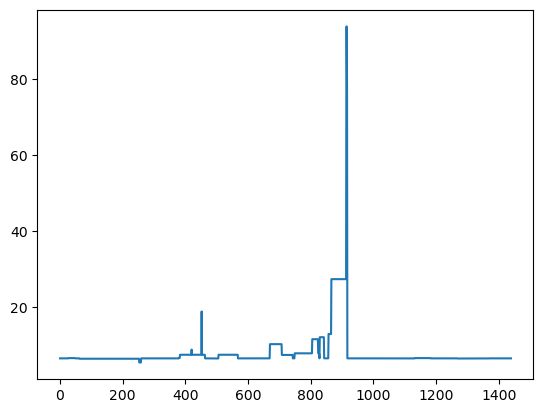

In [26]:
plt.plot(range(0,1440), maxlist)

In [18]:
df1.to_csv('pleas_save_me')